<a href="https://colab.research.google.com/github/Kamil11-del/DIGITAL-IMAGE-PROCESSING/blob/main/CH_03_DIGITAL_IMG_PROC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GAMMA RAYS EXAMPLE

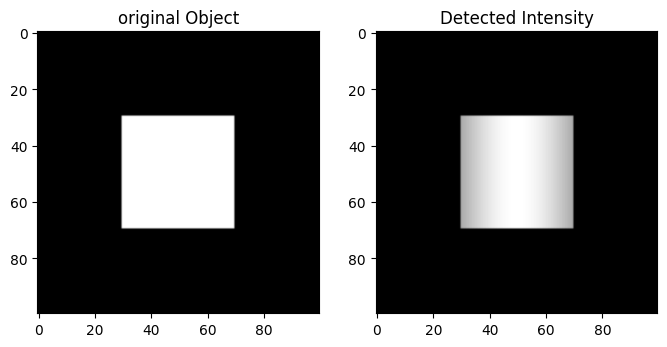

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# creating a square object
object_size = 100
object = np.zeros((object_size, object_size))
object[30:70, 30:70]=1
#simulate gamma rays emission and interaction
gamma_ray_intensity = np.exp(-(np.linspace(0,1,object_size)-0.5)**2/0.1)
detected_intensity = object* gamma_ray_intensity

# display the original object and detected intensity
plt.figure(figsize = (8,4))
plt.subplot(121)
plt.imshow(object, cmap ='gray')
plt.title('original Object')
plt.subplot(122)
plt.imshow(detected_intensity, cmap='gray')
plt.title('Detected Intensity')
plt.show()

# SPATIAL RESOLUTION

The original image :


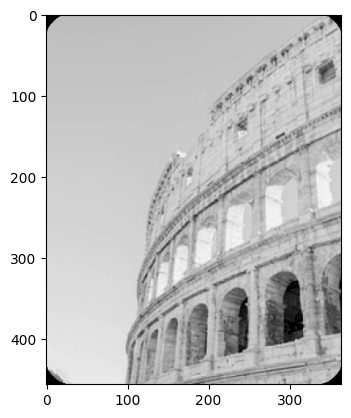

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# reading the currrent image
imag1 = cv2.imread('/Rectangle 8.png',0)

#obtained the size of the image
[m,n] = imag1.shape

#first of all show the original image
print('The original image :')
plt.imshow(imag1,cmap='gray')


# DOWN SAMPLING

Down sampled image :


<ipython-input-5-f60441a7d5d7>:4: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  image2 = np.zeros((m//f,n//f), dtype = np.int)


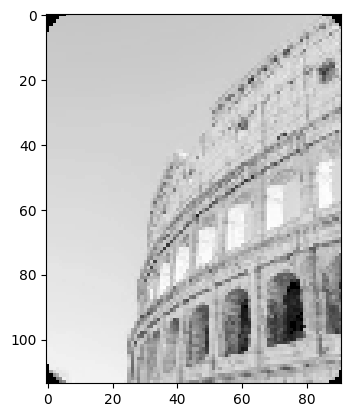

In [ ]:
# First of all assign the down sampling number
f =4
#Now create a matrix of all zeros for down sampled values
image2 = np.zeros((m//f,n//f), dtype = np.int)
# Assign the down sampled values from the original image according to the down sampling frequency.
# For example, if the down sampling rate f=2, take  pixel values from alternate rows and columns
# and assign them in the matrix created above.
for i in range(0,m,f):
  for j in range(0,n,f):
    try:
       image2[i//f][j//f] = imag1[i][j]
    except IndexError:
      pass

# show the down sampled image here
print('Down sampled image :')
plt.imshow(image2,cmap='gray')



# UP SAMPLING

In [ ]:
#create a empty matrix of zeros
image3 = np.zeros((m,n),dtype= np.int)
# new size of the matrix
for i in range(0,m-1,f):
  for j in range(0,n-1,f):
    image3[i][j] = image2[i//f][j//f]
    # Nearest neighbour interpolation-Replication
# Replicating rows

for i in range(1, m-(f-1), f):
    for j in range(0, n-(f-1)):
        image3[i:i+(f-1), j] = image3[i-1, j]

# Replicating columns
for i in range(0, m-1):
    for j in range(1, n-1, f):
        image3[i, j:j+(f-1)] = image3[i, j-1]

# Plot the up sampled image
print('Up Sampled Image:')
plt.imshow(image3, cmap="gray")
print(image3)

NameError: name 'np' is not defined

# Using Numpy Spatial Resolution


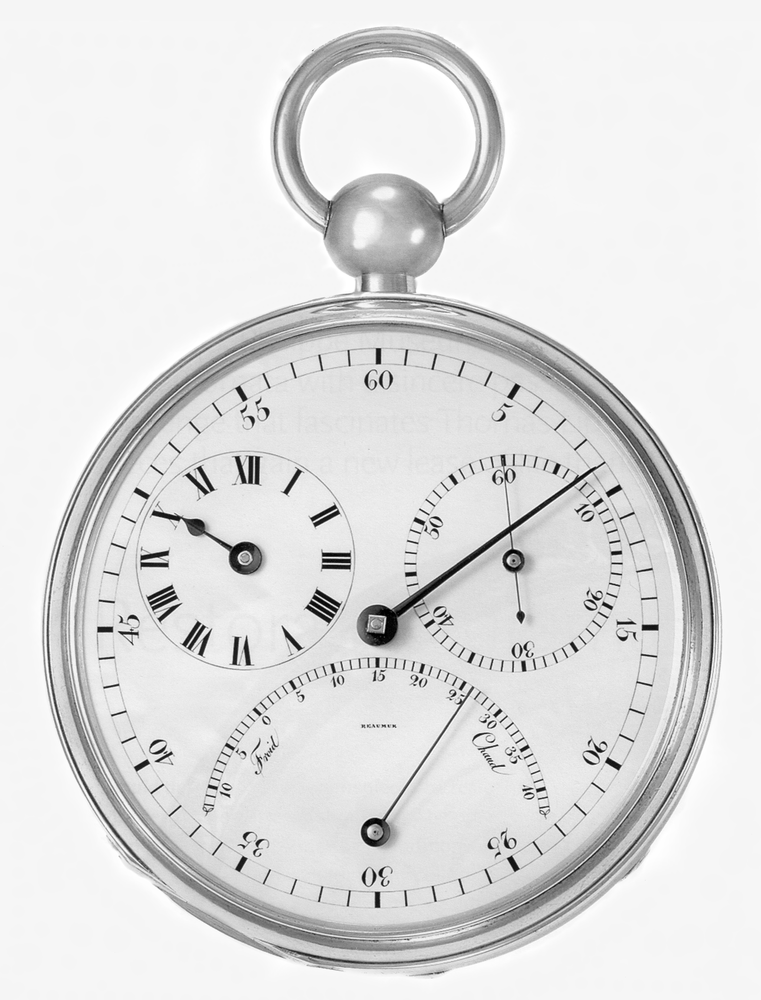

(3692, 2812, 3)
2812X3692


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

input_image = cv2.imread('/content/drive/MyDrive/chap_02_imgs/Fig0220(a)(chronometer 3692x2812  2pt25 inch 1250 dpi).tif')
cv2_imshow(input_image)
print(input_image.shape)
w = input_image.shape[1]
h = input_image.shape[0]
print(str(w)+ 'X'+str(h) )


 this figure shows the effects of reducing the spatial resolution of an image. In this code we get the image by cv2 library we then update its resolution or dimension related to our need if we want to up sample or to double * with it and if want to make it down sample divide it / . After that we create an empty matrix and after that we calculate the scaling Factors to map the coordinates in the output image to the original image. These factors are the inverses of the scaling factors since we are downsampling.

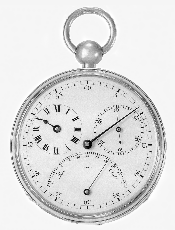

(230, 175, 3)
175X230


In [ ]:
new_width = input_image.shape[1] // 16
new_height = input_image.shape[0] // 16
out_image = np.empty((new_height,new_width), dtype = np.uint8)

# calculate the scaling factors
x_scale = input_image.shape[1] / new_width
y_scale = input_image.shape[0] / new_height

# create new coordinates
x_coord = np.arange(new_width)
y_coord = np.arange(new_height)

#
original_x_coord = (x_coord * x_scale).astype(int)
original_y_coord = (y_coord * y_scale).astype(int)

out_image = input_image[original_y_coord][:,original_x_coord]
cv2_imshow(out_image)
print(out_image.shape)
w = out_image.shape[1]
h = out_image.shape[0]
print(str(w)+ 'X'+str(h) )

# Reducing Noice in Image

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

my_img = cv2.imread('/content/drive/MyDrive/DIP3E_CH02_Original_Images/DIP3E_Original_Images_CH02/Fig0226(galaxy_pair_original).tif')
noisy_imgs = []
for i in range(50):
  noisy_imgs.append(my_img)

def averaging_images(images):
  num_images = len(images)

  if num_images == 0:
    return None

  shape = images[0].shape
  for img in images:
    if img.shape != shape:
      raise ValueError('All images must have same shape')
  #convert the list of images into numpy array
  image_array = np.array(images)

  # calculate the average image
  average_image = np.mean(image_array,axis =0)

  return average_image

average_image = averaging_images(noisy_imgs)
cv2_imshow(average_image)


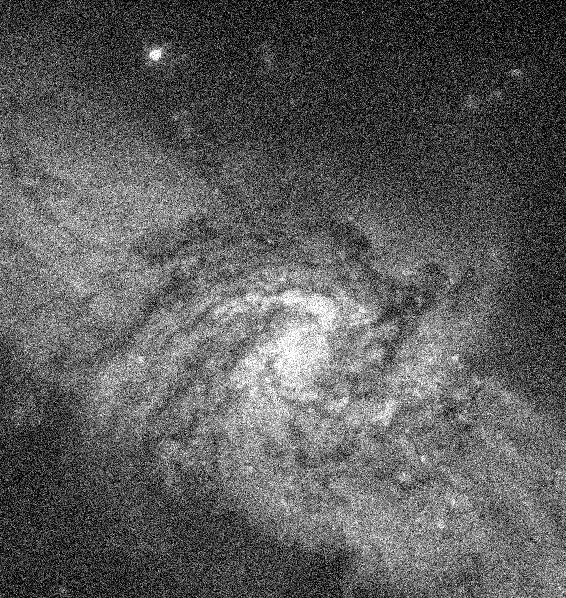

In [ ]:
image = cv2.imread('/content/drive/MyDrive/DIP3E_CH02_Original_Images/DIP3E_Original_Images_CH02/Fig0226(galaxy_pair_original).tif',cv2.IMREAD_GRAYSCALE)

gaussian_noise = np.random.normal(1, 40, image.shape)
noisy_image = np.clip(image + gaussian_noise, 0, 255).astype(np.uint8)
cv2_imshow(noisy_image)


In [ ]:
nois_imgs=[]
k = [5,10,20,50,100]
for i in range(k[0]):
  nois_imgs.append(noisy_image)

def imgs_averaging(imgs):
  images_array = np.array(imgs)
  average_image = np.mean(images_array, axis=0).astype(np.uint8)
  return average_imagg

avg_img = imgs_averaging()

# 2nd Mehtod Adjust Control in Our Hand


Reducing noise in images through a process called image averaging. This technique is commonly used in various fields, including astronomy, to enhance the quality of images that may be corrupted by noise. In this Algorithm the K and the standard deviation is the main points As you increase the number of noisy images used (K), the standard deviation of the averaged image decreases. This means that the image becomes less noisy and approaches the noiseless image as K increases. The (K) value is in the formula where the calculation occure The Formula for SD = s_g(x, y) = s_h(x, y) / sqrt(K). But for doing all this we should make it clear that all the images should of the same shape.

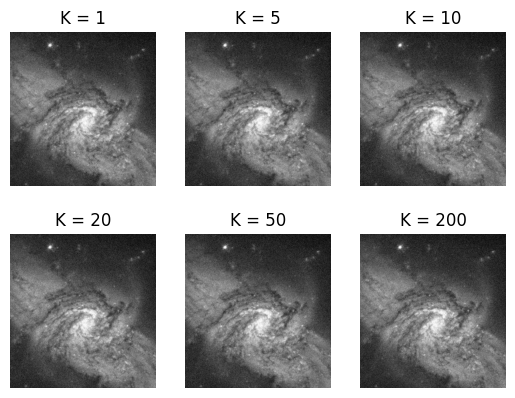

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Create a clean image (replace 'clean_image.png' with your image path)
clean_image = plt.imread('/content/drive/MyDrive/chap_02_imgs/Fig0226(galaxy_pair_original).tif')

# Define parameters for the noise
mean = 0
stddev = 20 # Adjust this to control the noise intensity

# Create noisy images with increasing/decreasing intensity (K)
K_values = [1, 5, 10, 20, 50, 200]  # Adjust this list as needed

noisy_images = []
for K in K_values:
    noisy_image = clean_image + np.random.normal(mean, stddev, clean_image.shape)
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)  # Ensure pixel values stay within 0-255 range
    noisy_images.append(noisy_image)

# Display the noisy images
for i, noisy_image in enumerate(noisy_images):
    plt.subplot(2, 3, i+1)
    plt.imshow(noisy_image, cmap='gray')
    plt.title(f'K = {K_values[i]}')
    plt.axis('off')

plt.show()


# Image Subtraction

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Load the mask image (hxy) and sample live image (fxy) using NumPy
mask_image = plt.imread('/content/drive/MyDrive/chap_02_imgs/Fig0228(a)(angiography_mask_image).tif')  # Load the mask image
live_image = plt.imread('/content/drive/MyDrive/chap_02_imgs/Fig0228(b)(angiography_live_ image).tif')  # Load a sample live image

# Perform image subtraction to get the enhanced detail image (gxy)
enhanced_detail_image =  mask_image - live_image

# Display the original images and the enhanced detail image
plt.subplot(131)
plt.imshow(mask_image, cmap='gray')
plt.title('Mask Image (hxy)')

plt.subplot(132)
plt.imshow(live_image, cmap='gray')
plt.title('Live Image (fxy)')

plt.subplot(133)
plt.imshow(enhanced_detail_image, cmap='gray')
plt.title('Enhanced Detail Image (gxy)')

plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/chap_02_imgs/Fig0228(a)(angiography_mask_image).tif'

# Logical operation on Image using Sets

Here let suppose original img is 'A' and the negative image which is the result it is done by subtracting the intensity of original img from the total intensity which is 255 in case of 8-bit image by 2^K formula.
A^c = {(x,y,K-z)|(x,y,z) is subset of A}
as doing this operation we get the below output.

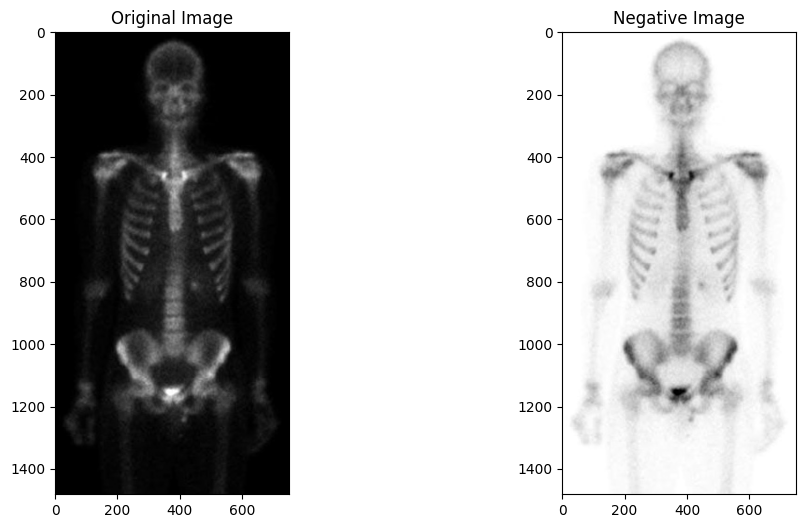

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

original_img = cv2.imread('/content/drive/MyDrive/chap_02_imgs/Fig0232(a)(partial_body_scan).tif', cv2.IMREAD_GRAYSCALE)

k = 255

negative_img = k - original_img  # Compute the negative image

negative_img = np.clip(negative_img, 0, 255).astype(np.uint8)

# Display the original and negative images using Matplotlib
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(original_img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(negative_img, cmap='gray')
plt.title('Negative Image')

plt.show()


f. Neighborhood
processing generates a corresponding pixel at the same coordinates in an output
(processed) image, g, such that the value of that pixel is determined by a specified
operation on the neighborhood of pixels in the input image with coordinates in the
set Sxy . For example, suppose that the specified operation is to compute the average
value of the pixels in a rectangular neighborhood of size m n × centered on ( , x y). in this manner The image is created using neighborhood of size 41 x 41. The net effect is to perform local blurring in the original image.

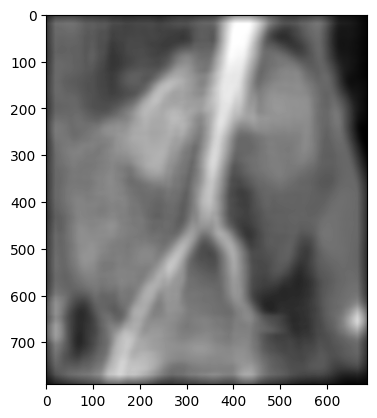

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

def neighborhod_average(input_img,neighborhod_size):
  row, col = input_img.shape
  output_img = np.zeros_like(input_img, dtype=float)

  padded_img = np.pad(input_img, neighborhod_size//2, mode = 'constant')

  for i in range(row):
    for j in range(col):
      neighborhood = padded_img[i:i+neighborhod_size, j:j+neighborhod_size]

      avg_value = np.mean(neighborhood)
      output_img[i,j] = avg_value
  return output_img.astype(np.uint8)

input_img = cv2.imread('/content/drive/MyDrive/chap_02_imgs/Fig0235(c)(kidney_original).tif',cv2.IMREAD_GRAYSCALE)

neighborhod_size = 41

output_img = neighborhod_average(input_img,neighborhod_size)
plt.imshow(input_img,cmap='gray')
plt.imshow(output_img,cmap='gray')

# Contrast enhancement using power-law intensity transformations.

In addition to gamma correction, power-law transformations are useful for general-purpose contrast manipulation. here we can't recognize the fracture clearly because of darkness and This can be accomplished
using a power-law transformation with a fractional exponent (s = cr**gamma)
by decreasing the value of gamma we can enhance the image and remove the darkness from the wanted part and thus recognize the fracture clearly.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

# Here we will define the function for the power law transformation
def power_law_transform(image,gamma,c):
  image_float = image.astype(float) # we convert the image in float formate for calculations
  enhanced_image = c *np.power(image,gamma) # formula used for power law transformation for enhancement
  enhanced_image = np.clip(enhanced_image,0,255)# here we give a constraint to use values in [0,255] range
  enhanced_image = enhanced_image.astype(np.uint8) # here we convert again to uint8 mean in image formate
  return enhanced_image


image_path ='/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0308(a)(fractured_spine).tif'
original_img = np.array(Image.open(image_path))

#we will intialize parameter required for the process
gamma = 1.5 # in this algorithm and in topic of book shows that the power gamma if less than 1 will brighten the
# the area but when we do this process and want to show it by plt library it shows fine results but when do
# the same and want to show through open CV it make the area darker if the value becomes less than 1.
c = 1
enhanced_image = power_law_transform(original_img, gamma, c)

# # Display the original and enhanced images
# plt.figure(figsize=(8, 4))
# plt.subplot(1, 2, 1)
# plt.title('Original Image')
# plt.imshow(original_img, cmap='gray')

# plt.subplot(1, 2, 2)
# plt.title(f'Enhanced Image (Gamma = {gamma})')
# plt.imshow(enhanced_image, cmap='gray')
# plt.show()
cv2_imshow(original_img)
cv2_imshow(enhanced_image)


# Negative Transformation Function

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

def negative_img(image,intensity): # defining a function of negative transformation function applying on a image to convert the darkness into brightness
  image_float = image.astype(float)
  output_img = intensity - 1 - image # function for image negatives s= L-1-r
  output_img = np.clip(output_img,0,255) # the image intensity should be in range 0,255
  output_img = output_img.astype(np.uint8) # converting back to uint mean in image formate
  return output_img

image_path ='/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0304(a)(breast_digital_Xray).tif'
original_img = np.array(Image.open(image_path))
intensity_L =256
final_output_img = negative_img(original_img,intensity_L)
cv2_imshow(original_img)
cv2_imshow(final_output_img)

# Log Transform Function

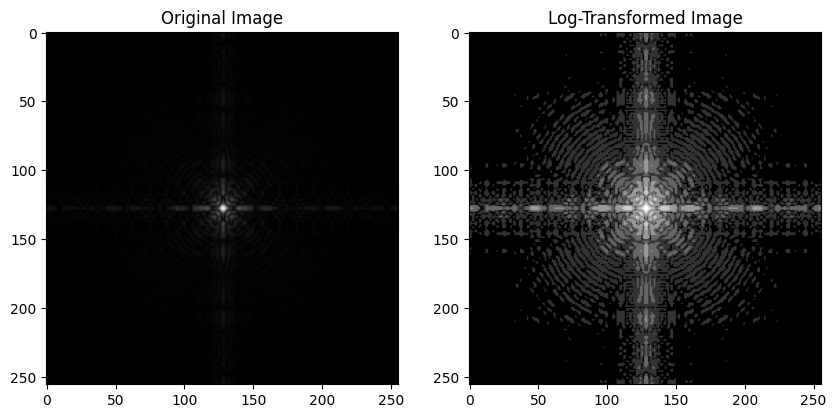

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

def log_transform(image,c): # defining a function of Log transformation function  applied to enhance the visibility of details in the darker regions of an image
  image_float = image.astype(float)
  output_img =  c * np.log1p(image_float) # function for log transformation s = c.log(1+r) where are the pixels
  output_img = np.clip(output_img,0,255) # the image intensity should be in range 0,255
  output_img = output_img.astype(np.uint8) # converting back to uint mean in image formate
  return output_img

image_path ='/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0305(a)(DFT_no_log).tif'
original_img = np.array(Image.open(image_path))
constant_c =1
transformed_image = log_transform(original_img, constant_c)

# Display the original and transformed images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(original_img, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Log-Transformed Image')
plt.imshow(transformed_image, cmap='gray')

plt.show()
#final_output_img = log_transform(original_img,c)
#cv2_imshow(original_img)
#cv2_imshow(final_output_img)


# CONTRAST STRETCHING OF AN IMAGE

 Contrast stretching aims to map the pixel values in an image to cover the full intensity range, enhancing the contrast. The basic idea is to linearly scale the pixel values so that the minimum value becomes 0, the maximum becomes 255 (for an 8-bit image), and the values in between are scaled proportionally.We want to scale the pixel values linearly to cover the full intensity range (0 to 255).This linear stretching assumes that the minimum and maximum values in the original image are not already at 0 and 255, respectively. If they are, the contrast stretching transformation won't have any effect, which is a desirable outcome when the image already covers the full intensity range.

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
import matplotlib.pyplot as plt

def contrast_stretching(image):
  r_min = np.min(image)
  r_max = np.max(image)
  stretched_image = ((image-r_min)/(r_max-r_min)) *255.0
  return stretched_image.astype(np.uint8)


image_path = '/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0310(b)(washed_out_pollen_image).tif'
original_image = np.array(Image.open(image_path))
stretched_img = contrast_stretching(original_image)
threshold_value = 128
binary_image=(stretched_img >= threshold_value) * 255
cv2_imshow(original_image)
cv2_imshow(stretched_img)
# cv2_imshow(binary_image)
plt.figure(figsize=(5,5))
plt.imshow(binary_image ,'gray')
plt.show()

# Intensity Slicing

BINARY IMAGE TRANSFORM :It enhances major blood vessels by setting a specific intensity band near the top of the scale to white and the rest to black. This creates a binary image where blood vessels and certain areas appear white, making it useful for studying shape characteristics.
GRAY_LEVEL TRANSFORM: It preserves the gray-level tonality of major blood vessels by setting a band of intensities around the mean intensity to black while leaving other intensities unchanged. This is useful when you want to measure the actual flow of the contrast medium over time.

In [ ]:
import numpy as np
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

# we will create two functions for both thresholding or binary_image transformation
#  and Gray level transformation

def intensity_slicing_binary(image,threshold):
  binary_img = (image > threshold).astype(np.uint8) * 255
  return binary_img

def intensity_slicing_grayLevel(image, mean_range_value):
  mean_intensity = np.mean(image)
  upper_bound = mean_intensity + mean_range_value /2
  lower_bound = mean_intensity - mean_range_value /2

  gray_image = np.copy(image)
  gray_image[(image >= lower_bound) & (image<=upper_bound)] =0
  return gray_image

image_path = '/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0312(a)(kidney).tif'
original_image = np.array(Image.open(image_path))

# The variable use for thresholding making image binary
threshold = 150
final_binary_img = intensity_slicing_binary(original_image,threshold)
# The variable use for gray_level transformation
mean_range = 30
final_grayLevel_img= intensity_slicing_grayLevel(original_image,mean_range)

# now visualixing images
cv2_imshow(original_image)
cv2_imshow(final_binary_img)
cv2_imshow(final_grayLevel_img)


# bit_Planes Slicing

Pixel values in images are made up of bits. For example, an 8-bit image has values composed of 8 bits (one byte).
Bit-plane slicing involves breaking down an image into its individual bits. In an 8-bit image, you have 8 one-bit planes, where each plane represents a specific bit position.
Think of each bit plane as a layer of the image, starting from the highest-order bit (most significant) to the lowest-order bit (least significant).
The higher-order planes often contain more visually significant data, while the lower-order planes contribute to subtler details.
Bit planes can be used for image compression and analysis. You can reconstruct an image using selected bit planes by multiplying each plane by a corresponding constant and adding them together.

In [ ]:
import numpy as np
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow

def get_bit_planes(image , plan_No):
  bit_planes = (image>> plan_No) & 1
  return bit_planes.astype(np.uint8) * 255

def reconstruct_image(bit_planes,plane_no):
  reconstructed_image = sum((bit_planes[i] * 2**plane_no[i]) for i in range(len(bit_planes)))
  return np.clip(reconstructed_image, 0,255).astype(np.uint8)

image_path = '/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0314(a)(100-dollars).tif'
original_img = np.array(Image.open(image_path))

bit_planes = [get_bit_planes(original_img,i) for i in range(0,8,1)]

selected_planes = [7,6]
reconstructed_image =reconstruct_image([bit_planes[i] for i in selected_planes], selected_planes)

cv2_imshow(original_img)
cv2_imshow(reconstructed_image)

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image

# defining the functions for global histogram equalization
def global_hist_equalization(image):
  hist, bins = np.histogram(image.flatten(),bins= 255,range=[0,255])
  cdf = hist.cumsum()
  normalized_cdf = cdf/ cdf[-1]
  equalized_image =(normalized_cdf[image] * 255).astype(np.uint8)
  return equalized_image

# defining the functions for local histogram equalization
def local_hist_equalization(image,nighborhood_size):
  height , width = image.shape
  equalized_image = np.zeros_like(image,dtype=np.uint8)

  for i in range(height):
    for j in range(width):
      i_start = max(0, i- nighborhood_size //2)
      i_end = min(height, i + nighborhood_size // 2 +1)
      j_start = max(0, j- nighborhood_size //2)
      j_end = min(width, j + nighborhood_size // 2 +1)
# now extracting the local region from the image
      local_region = image[i_start:i_end, j_start:j_end]
# after extracting we will perform histogram equalization on the local region
      hist, bins = np.histogram(local_region.flatten(), bins=255, range=[0,255])
      cdf = hist.cumsum()
      normalized_cdf = cdf/ cdf[-1]
      equalized_values =(normalized_cdf[local_region] * 255).astype(np.uint8)
      equalized_image[i, j] =int(np.mean(equalized_values))
  return equalized_image

image_path = '/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0326(a)(embedded_square_noisy_512).tif'
original_image= np.array(Image.open(image_path))

# calling the function and applying the global histogram equalization
global_equalized_img = global_hist_equalization(original_image)

neighborhood_size = 3
local_equalize_img = local_hist_equalization(original_image,neighborhood_size)

cv2_imshow(original_image)
cv2_imshow(global_equalized_img)
cv2_imshow(local_equalize_img)


# LOCAL ENHANCEMENT USING HISTOGRAM

Local enhancement using histogram statistics:
We can use the concepts presented in this section to formulate an approach for enhancing low-contrast details embedded in a background of similar intensity. The problem at hand is to enhance the lowcontrast detail in the dark areas of the image, while leaving the light background.
 We will consider the pixel at (, ) x y as a candidate for processing if k0<= mSxy/mG<= k1 , where k0 and k1 are nonnegative constants and k0< k1. same for the global standard deviation obtained. specified constant, C, to increase (or decrease) the value of its intensity level relative to the rest of the image. Thus, the additional complexity required to use local
statistics yielded results in this case that are superior to local histogram equalization

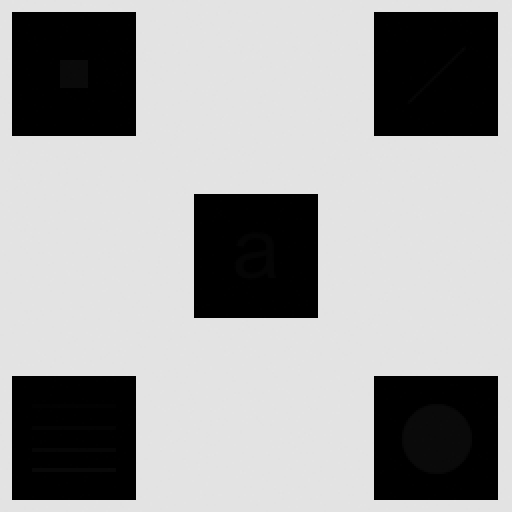

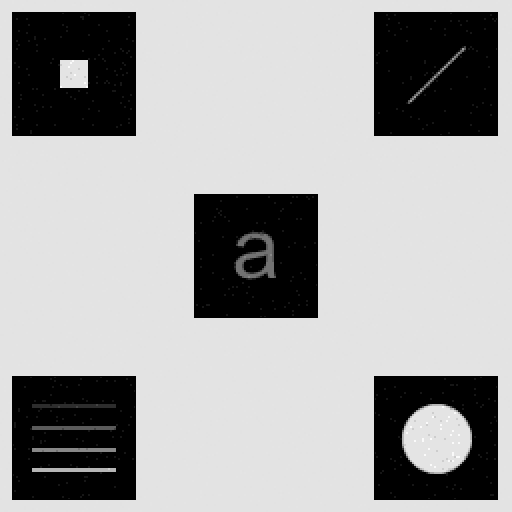

In [ ]:
import numpy as np
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

# defining the function fro histogram local enhancement statically
def local_enhancement_procedure(image, C,k0,k1,k2,k3):
  m,n = image.shape # assigning row and columns
  mG = np.mean(image) #calculating Global mean in entire img
  sG = np.std(image) # calculating Global standard deviation

  enhanced_image = np.copy(image)
  for x in range(m):
    for y in range(n):
      region = image[max(0,x-1):min(m,x+2), max(0,y-1):min(n,y+2)]
      mSxy = np.mean(region)
      sSxy = np.std(region)

      condition_on_intensity = k0<= mSxy/mG<= k1
      condition_on_contrast = k2<= sSxy/sG<=k3

      if condition_on_intensity and condition_on_contrast:
        enhanced_image[x,y] *= C
  return enhanced_image


image_path =  '/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0326(a)(embedded_square_noisy_512).tif'
original_image = np.array(Image.open(image_path))

C = 22.8
k0,k1,k2,k3 = 0,0.1,0,0.1
local_enhanced_img = local_enhancement_procedure(original_image,C,k0,k1,k2,k3)
cv2_imshow(original_image)
cv2_imshow(local_enhanced_img)



In [ ]:
import numpy as np
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

img_path = '/dog_img.webp'
original_image=np.array(Image.open(img_path))
cv2_imshow(original_image)


In [ ]:
kernel = np.array([[1,2,1],
                   [2,4,2],
                   [1,2,1]])*1/16
img = cv2.filter2D(original_image,-1,kernel)
cv2_imshow(img)


# LowPass Gaussian filter Kernel
(Zero , Mirror, Replicate Padding)

here We write an algorithm about smoothing the image using smoothing gaussian filter kernel, we use it for many purpose it make avoid complexity and also its form is separable which mean we can do convulution separately on 1D form, In this algorithm The mean of the Gaussian filter is zero because it is symmetric around its center, and the standard deviation (
σ) controls the width of the filter.For a 2D Gaussian filter, the filter kernel is the outer product of two 1D Gaussian functions, one along the rows and one along the columns:
The convolution process blurs the image by smoothing out high-frequency components (e.g., noise) while preserving low-frequency components (e.g., edges).
The level of blurring is controlled by the standard deviation (σ) of the Gaussian filter. A larger σ corresponds to a wider bell curve, resulting in stronger smoothing.
NOTE:  if we have an image of four time of old ones then for that to get the desirable smoothing as before we should increase the size of kernel four time and sigma value. and the K value is  1 bcz the wieght sum should be 1 of the kernel

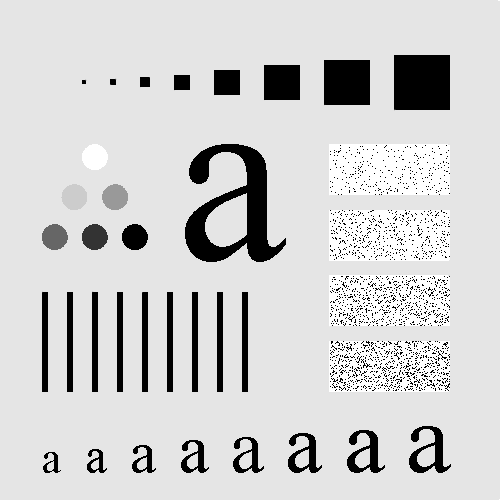

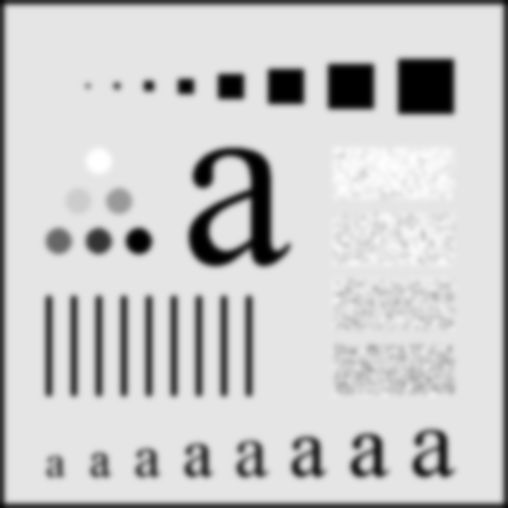

In [ ]:
import numpy as np
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow

image_path = '/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0333(a)(test_pattern_blurring_orig).tif'
image_path_2='/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0334(a)(hubble-original).tif'
image_path_3 ='/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0335(a)(ckt_board_saltpep_prob_pt05).tif'
original_image = np.array(Image.open(image_path))
padded_img = np.pad(original_image, pad_width=4, mode='constant', constant_values=0) # zero padding to image
# padded_img = np.pad(original_image, pad_width=2, mode='reflect') # mirror padding to image
#padded_img = np.pad(original_image, pad_width=2, mode='edge') # replicate padding to image

def generate_gaussian_kernel(size, sigma):
    """Generate a 2D Gaussian kernel."""
    kernel = np.fromfunction(
        lambda x, y: (1/(2*np.pi*sigma**2)) * np.exp(-((x - (size-1)/2)**2 + (y - (size-1)/2)**2) / (2*sigma**2)),
        (size, size)
    )
    return kernel / np.sum(kernel)

def lowpass_filter(image, kernel):
    """Apply low-pass filtering to the image using the given kernel."""
    return cv2.filter2D(image, -1, kernel)

# size = 187
# sigma = 31
# here below we use this different size and sigma for practicing on image comparing with median filter
size= 19
sigma = 3

gaussian_kernel = generate_gaussian_kernel(size,sigma)

filtering_image = lowpass_filter(padded_img,gaussian_kernel)
cv2_imshow(original_image)
cv2_imshow(filtering_image)



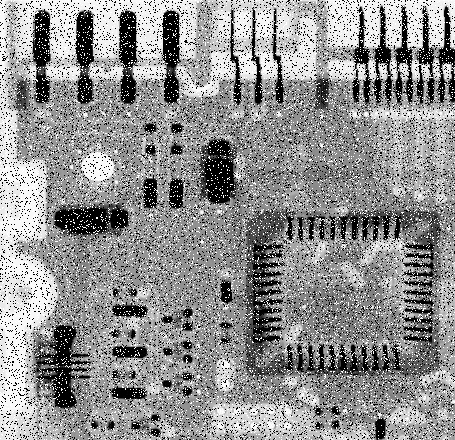

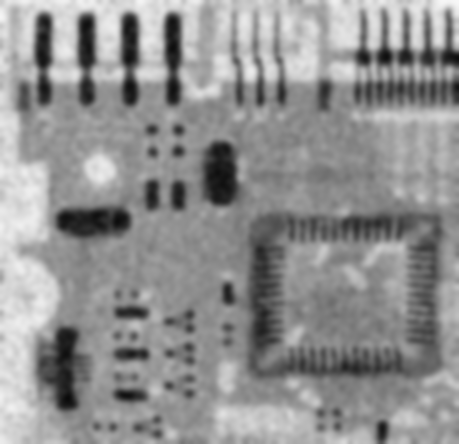

In [ ]:
filtere_img = lowpass_filter(padded_img,gaussian_kernel)
cv2_imshow(original_image)
cv2_imshow(filtere_img)

# Sharpening image Using Laplacian

# UNSHARP masking and HighBoost filtering


In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

def gaussian_kernel(sigma,size):
  kernel = np.fromfunction(
        lambda x, y: (1/ (2 * np.pi * sigma ** 2)) * np.exp(-((x - (size - 1) / 2)**2 + (y - (size - 1) / 2)**2) / (2 * sigma ** 2)),
        (size, size)
    )
  return kernel / np.sum(kernel)

def unsharp_mask(image, blured_img , k):
  unsharped_Mask = image - blured_img
  unsharped_Mask = np.clip(unsharped_Mask, 0,255)
  sharpened = image +k * unsharped_Mask
  return np.clip(sharpened,0,255)

original_img = cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0340(a)(dipxe_text).tif')

cv2_imshow(original_img)

In [ ]:
# initializing the size of kernel and sigma and also generating the
# kernel and bluredimage

size = 31
sigma = 5
gaussian_kernel_2d = gaussian_kernel(5,31)
blured_img = cv2.filter2D(original_img , -1, gaussian_kernel_2d)
cv2_imshow(blured_img)
# plt.imshow(blured_img, cmap='gray')
# plt.title('Blurred Image')


In [ ]:
mask = original_img - blured_img
# mask = np.clip(mask,0,255)
cv2_imshow(mask)
# plt.imshow(mask, cmap='gray')
# plt.title('Mask')


In [ ]:
# Now we are making mask the unsharped mask
k =1 # we will change this value for more better called highboost filtering

sharped_img = unsharp_mask(original_img, blured_img, k)

cv2_imshow(sharped_img)
# plt.imshow(sharped_img, cmap='gray')
# plt.title('Sharped Image')


# The Gradient USing Sobel operator


The Sobel operator performs a 2-D spatial gradient measurement on an image and so emphasizes regions of high spatial frequency that correspond to edges. Typically it is used to find the approximate absolute gradient magnitude at each point in an input grayscale image.In theory at least, the operator consists of a pair of 3×3 convulotional kernels. One kernel is simply the other rotated by 90°.( sobel_x_gradient, and sobel_y_gradient), The gradient can be used also to highlight small specs that may not be readily visible in a gray-scale image. The parameters 1, 0 and 0, 1 in the Sobel operator refer to the direction in which the derivative is calculated

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from scipy.ndimage import sobel

original_image= cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0342(a)(contact_lens_original).tif', cv2.IMREAD_GRAYSCALE)

# Apply the Sobel operator to compute gradients in the x and y directions
sobel_x_gradient = cv2.Sobel(original_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y_gradient = cv2.Sobel(original_image, cv2.CV_64F, 0, 1, ksize=3)

# now calculating the magnitude of the gradient
gradient_magnitude =  np.sqrt(sobel_x_gradient**2 + sobel_y_gradient**2)

# Normalize the gradient magnitude to the range [0, 255]
normalized_gradient = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)

cv2_imshow(original_image)

In [ ]:
cv2_imshow(gradient_magnitude)

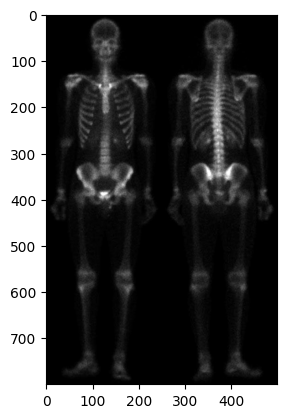

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import scipy as sp
import matplotlib.pyplot as plt


image = cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0343(a)(skeleton_orig).tif', 0)

plt.imshow(image, 'gray')

 the original image, obtained using the
kernel [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]] .This image was scaled (for display only) using the
technique  r. The dominant features of
the image are edges and sharp intensity discontinuities. The background, previously black, is now gray as a result of scaling. This grayish appearance is typical of Laplacian images that have been scaled properly .We can obtain a sharpened image at this point simply by
adding original_image and sharpend_laplacian_image, according to laplacian formula in book it is eq [3.54]. Just by looking at the noise level in sharpend_laplacain_image, we would expect a rather noisy sharpened image if we added. This is confirmed by the result in combine_image.

In [ ]:
image.shape

(800, 500)

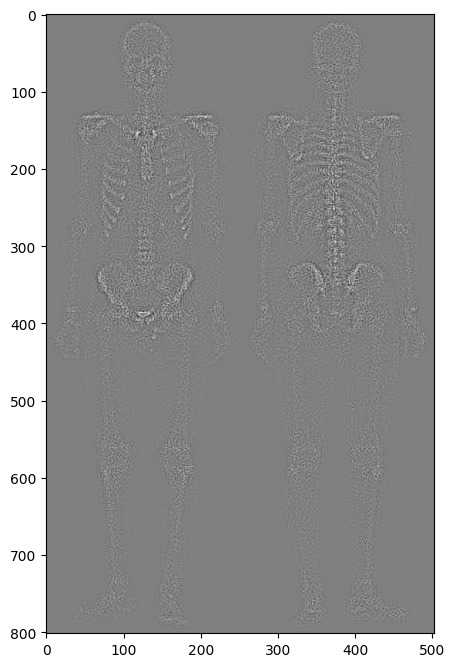

In [ ]:
kernel = np.array([
    [-1,-1,-1],
    [-1,8,-1],
    [-1,-1,-1]
  ])

image_lap = sp.signal.convolve(image, kernel)
plt.figure(figsize=(5, 10))
plt.imshow(image_lap, 'gray')
plt.show()

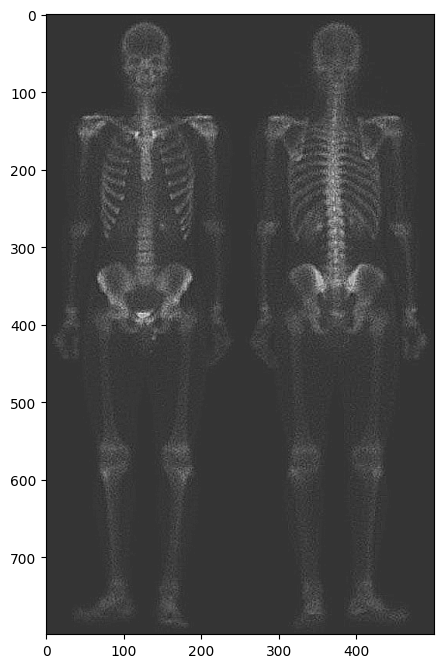

In [ ]:
image_sharpened = image + 1*image_lap[1:-1, 1:-1]
plt.figure(figsize=(5, 10))
plt.imshow(image_sharpened, 'gray')
plt.show()

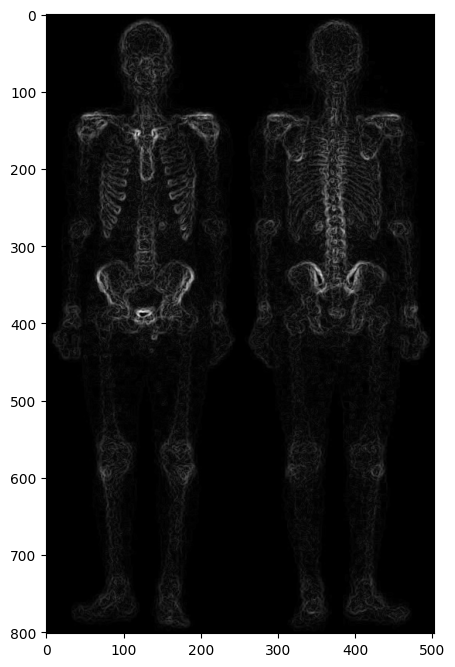

In [ ]:
sobel_kernel_xdirect = np.array([
    [-1,-2,-1],
    [0,0,0],
    [1,2,1]
    ])
sobel_kernel_ydirect = np.array([
    [-1,0,1],
    [-2,0,2],
    [-1,0,1]
])
sobel_x_gradient= sp.signal.convolve(image, sobel_kernel_xdirect)
sobel_y_gradient= sp.signal.convolve(image, sobel_kernel_ydirect)

# now calculating the magnitude of the gradient
gradient_magnitude =  np.sqrt(sobel_x_gradient**2 + sobel_y_gradient**2)
plt.figure(figsize=(5, 10))
plt.imshow(gradient_magnitude, 'gray')
plt.show()

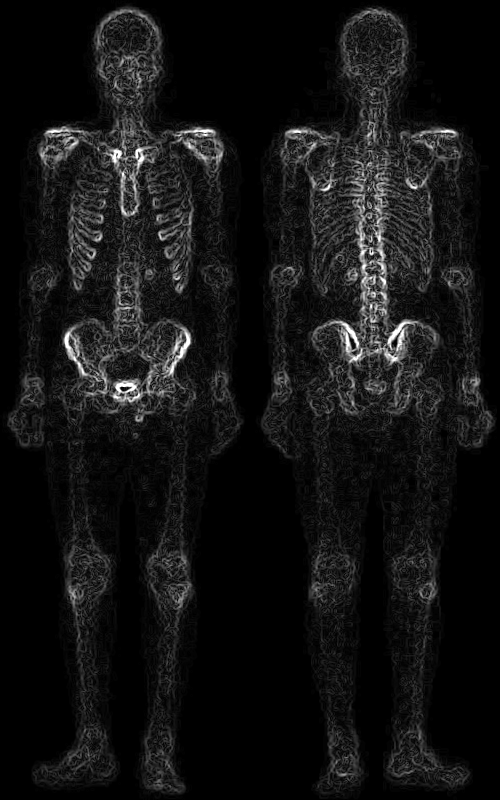

In [ ]:
# Apply the Sobel operator to compute gradients in the x and y directions
sobel_x_gradient2 = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y_gradient2 = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

# now calculating the magnitude of the gradient
gradient_magnitude2 =  np.sqrt(sobel_x_gradient2**2 + sobel_y_gradient2**2)

# Normalize the gradient magnitude to the range [0, 255]
normalized_gradient = cv2.normalize(gradient_magnitude2, None, 0, 255, cv2.NORM_MINMAX)
cv2_imshow(gradient_magnitude2)

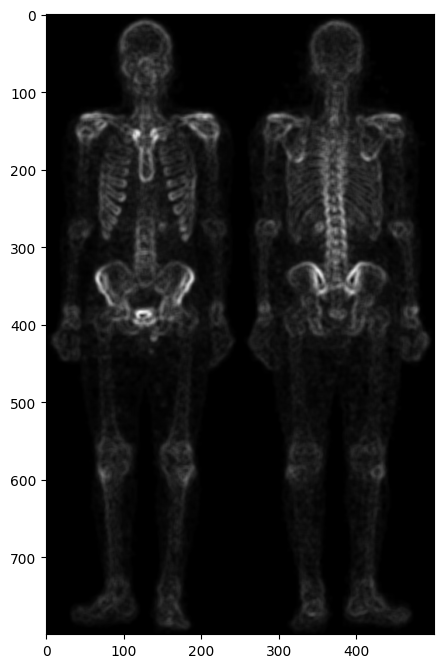

(800, 500)

In [ ]:
# sobel image smoothed with a box filter of size (5,5)
box_filter = np.ones((5,5), dtype = np.float32)/25.0
smoothed_sobel_image=sp.ndimage.convolve(gradient_magnitude,box_filter)
plt.figure(figsize=(5,10))
plt.imshow(smoothed_sobel_image,'gray')
plt.show()
smoothed_sobel_image.shape

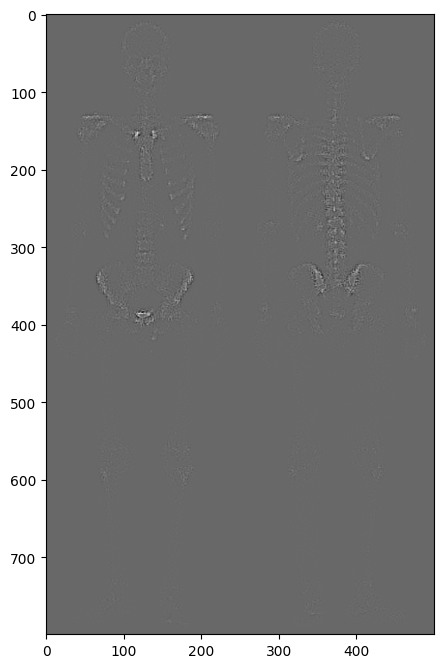

In [ ]:
# Multiply the scaled Laplacian image with the smoothed image
mask_image= np.multiply(image_lap[1:-1, 1:-1],smoothed_sobel_image)
plt.figure(figsize =(5,10))
plt.imshow(mask_image,'gray')
plt.show()

# CHAPTER #03
INTENSITY TRANSFORMATION AND SPATIAL FILTERING

# Negative image

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

original_image = cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0304(a)(breast_digital_Xray).tif')
negative_img = 255 - original_image
cv2_imshow(original_image)
cv2_imshow(negative_img)

# Log Transformation and inverse of it

The log transformation is typically used to enhance the visibility of details in the darker regions of an image, especially in images with a wide range of intensity values.  The transformation compresses the range of pixel values, bringing extreme values closer together. This is useful when an image has a wide range of intensities.In images where details are concentrated in dark areas, the log transformation can enhance these details for better visibility.

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
image_path ='/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0305(a)(DFT_no_log).tif'
original_img = np.array(Image.open(image_path))
transformed_image = 1 * np.log(original_img)
transformed_image = np.clip(transformed_image,0,255)

plt.figure(figsize= (5,5))
plt.imshow(transformed_image, 'gray')
plt.show()
# cv2_imshow(scaled_img)

In [ ]:
# INVERSE OF THE LOG TRANSFORMATION
inverse_log_transformed= np.exp(transformed_image / 1) - 1
plt.figure(figsize= (5,5))
plt.imshow(inverse_log_transformed, 'gray')
plt.show()

# Power Law or gamma Transformation

we are more sensitive to changes in dark as compared to bright. You may have realized it yourself as well! =>
But our camera does not work like this, camera follows a linear relationship,  computer screen have Intensity to voltage response curve which is a power function with exponents (linear to curve).results in images that are darker than intended.

---
To correct this, we apply gamma correction to the input signal. This input cancels out the effects generated by the display and we see the image as it is


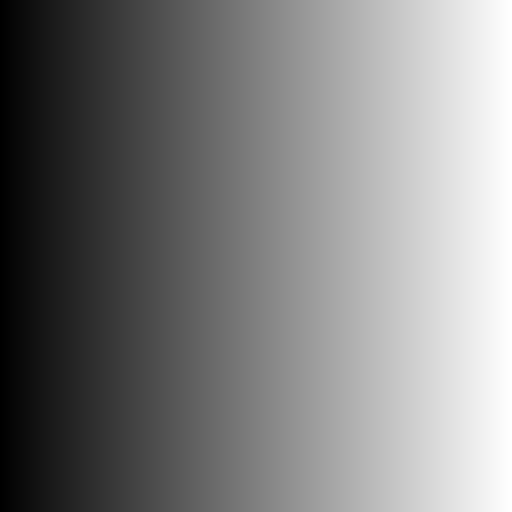

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

original_img = cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0307(a)(intensity_ramp).tif')
cv2_imshow(original_img)
normalized_img = original_img/255.0

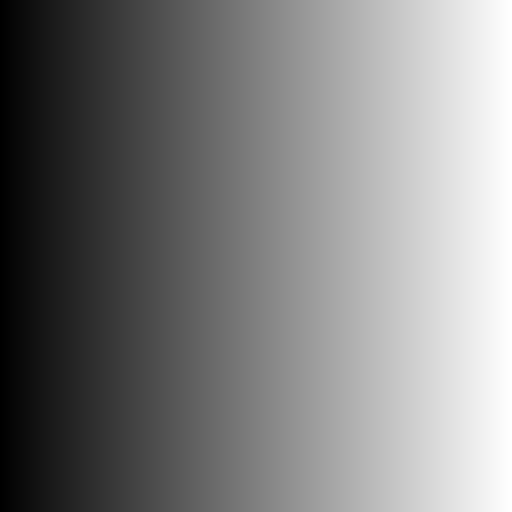

In [ ]:
gamma_transformed_img = 1 *(normalized_img ** 1)
gamma_transformed_img = (gamma_transformed_img * 255).astype(np.uint8)
cv2_imshow(gamma_transformed_img)

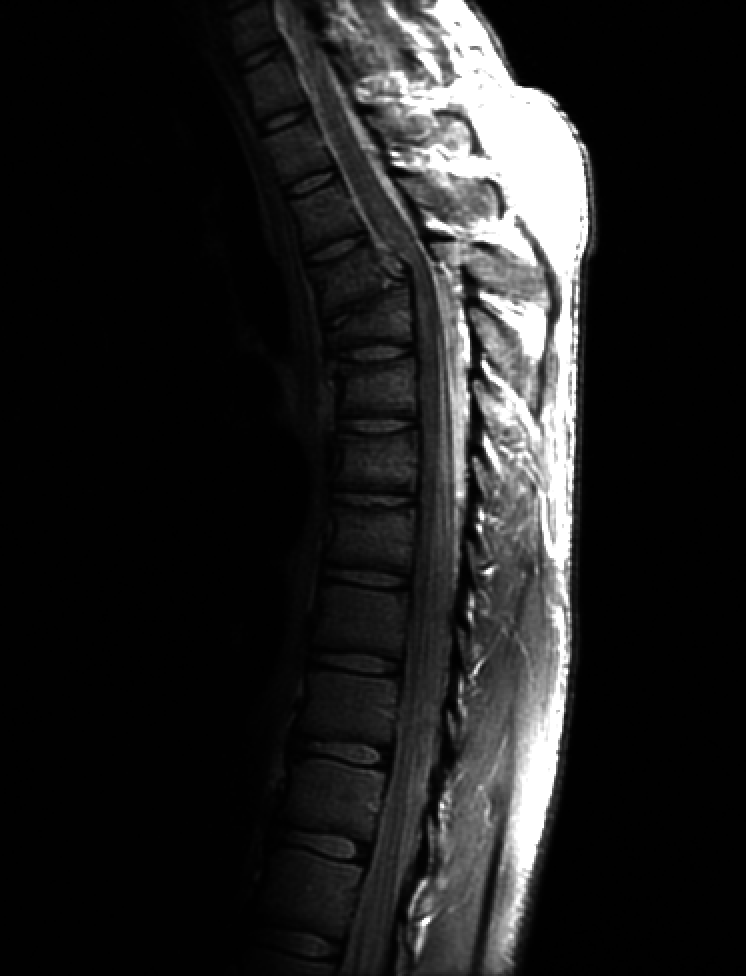

In [ ]:
# We can use the power law transformation for image contrast enhancement
image_fracture = cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0308(a)(fractured_spine).tif')

cv2_imshow(image_fracture)

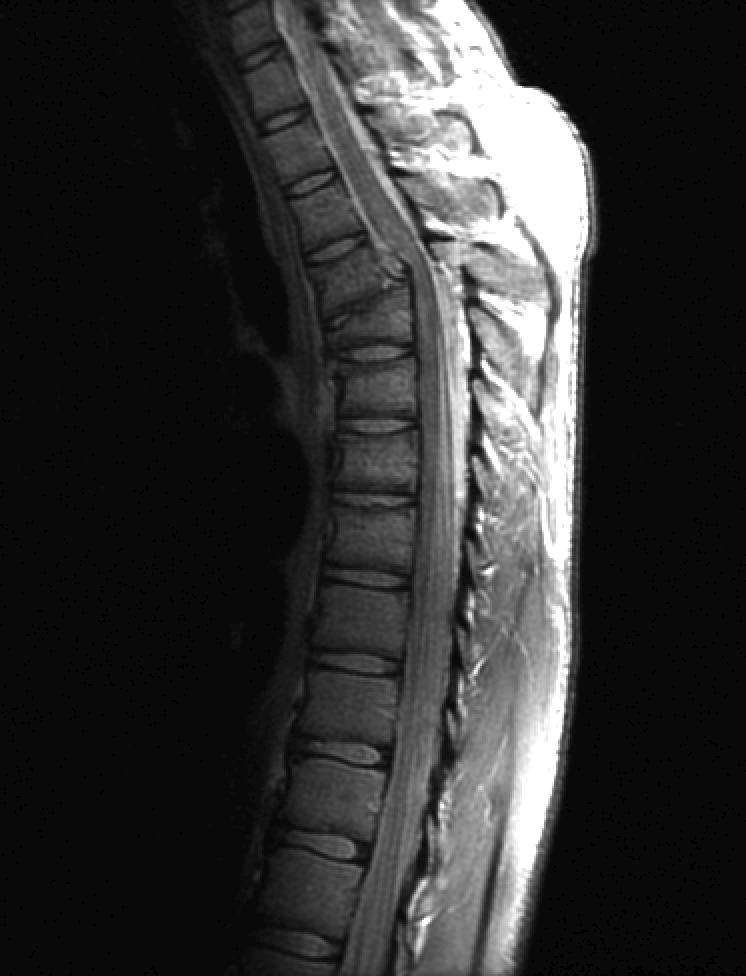

In [ ]:
# we will varying the value of gamma for different contrast
# Image transformed with gamma value {0.6}
image_normalized= image_fracture/255.0 # image normalize so the value of intensities lies in [0,1]
image_transformed_gamma_0_point_6= 1 *(image_normalized ** 0.6) # using power law transformation formula
image_transformed_gamma_0_point_6 = (image_transformed_gamma_0_point_6 * 255).astype(np.uint8)# denormalizing back to its original intensities
cv2_imshow(image_transformed_gamma_0_point_6)


In [ ]:
# Image transformed with gamma value {0.4}
image_transformed_gamma_0_point_4= 1 * (image_normalized ** 0.4)
image_transformed_gamma_0_point_4 = (image_transformed_gamma_0_point_4 * 255).astype(np.uint8)
cv2_imshow(image_transformed_gamma_0_point_4)

In [ ]:
# Image transformed with gamma value {0.3}
image_transformed_gamma_0_point_3= 1 *(image_normalized ** 0.3)
image_transformed_gamma_0_point_3 = (image_transformed_gamma_0_point_3 * 255).astype(np.uint8)
cv2_imshow(image_transformed_gamma_0_point_3)

**Another Example of Power law transformation**:
in which we will reduce the gamma value to reduce the contrast and hence curve be like concave shape.
on the other hand if increase contrast will be increased.

In [ ]:
image = cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0309(a)(washed_out_aerial_image).tif')
cv2_imshow(image)

In [ ]:
image_normalized = image/255.0
contrast_img_gamma_value = 1 * (image_normalized ** 5.0)# varying the value from (3.0 -> 4.0 -> 5.0)
contrast_img_gamma_value = (contrast_img_gamma_value * 255).astype(np.uint)
cv2_imshow(contrast_img_gamma_value)

# Bit slicing techniques


In [ ]:
import numpy as np
image = np.array([
    [3, 7, 1, 5, 4],
    [0, 6, 2, 7, 3],
    [1, 4, 6, 2, 5],
    [7, 0, 3, 1, 4],
    [2, 5, 7, 6, 0]
], dtype=np.uint8)

# defining a function to convert the each decimal value mean the pixel value into its binary
def decimal_to_bin(decimal_value, bit_value):
  binary = bin(decimal_value)[2:]
  binary = binary.zfill(bit_value)
  return binary

# defining a function for bit plane slicing in image
def bit_plane_slicing(image):
    num_bits = 3

    # Create a list of images for each bit plane
    bit_planes = [np.zeros(image.shape, dtype=np.uint8) for _ in range(num_bits)]

    # Perform bit-plane slicing
    for i in range(num_bits):
        # Assign bits from MSB to LSB
        bit_value = 2 ** (num_bits - 1 - i)

        # Ensure values are 0 or 1
        bit_planes[i] = (image & bit_value) >> (num_bits - 1 - i)

    return bit_planes

binary_image = np.array([[decimal_to_bin(value, 3) for value in row] for row in image])
print(binary_image)

11
111
1
101
100
0
110
10
111
11
1
100
110
10
101
111
0
11
1
100
10
101
111
110
0
[['011' '111' '001' '101' '100']
 ['000' '110' '010' '111' '011']
 ['001' '100' '110' '010' '101']
 ['111' '000' '011' '001' '100']
 ['010' '101' '111' '110' '000']]


In [ ]:
# Perform bit-plane slicing
bit_planes = bit_plane_slicing(image)

# Display the bit planes
for i, plane in enumerate(bit_planes):
    print(f"Bit Plane {i} (1-bit values):\n")
    for row in plane:
        print(" ".join([str(value) for value in row]))
    print("\n")

Bit Plane 0 (1-bit values):

0 1 0 1 1
0 1 0 1 0
0 1 1 0 1
1 0 0 0 1
0 1 1 1 0


Bit Plane 1 (1-bit values):

1 1 0 0 0
0 1 1 1 1
0 0 1 1 0
1 0 1 0 0
1 0 1 1 0


Bit Plane 2 (1-bit values):

1 1 1 1 0
0 0 0 1 1
1 0 0 0 1
1 0 1 1 0
0 1 1 0 0




In [ ]:
import numpy as np
image = np.array([1,3,3,0,1,2])
kernel = np.array([2,0,1])
image_length = len(image)
kernel_length = len(kernel)
output_img = np.zeros_like(image)

# fliping the kernel
kernel= np.flipud(kernel)

for i in range(image_length - kernel_length +1):
  region= image[i:i+kernel_length]

  output_img[i] = np.sum(region * kernel)

print(image)
print(kernel)
print(output_img)

[1 3 3 0 1 2]
[1 0 2]
[7 3 5 4 0 0]


In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# creating a image in arrays
image=np.array([[1, 2, 3,4,2,24,34],
                [4, 5, 6,4,2,24,34],
                [7, 8, 9,4,2,24,34],
                [1, 2, 3,4,2,24,34],
                [7, 8, 9,4,2,24,34],
                [4, 5, 6,4,2,24,34],
                [7, 8, 9,4,2,24,34]])
# creating the box kernel for smoothing
box_kernel = np.ones((3 ,3))/9

def convolution_by_boxFilter(image, kernel):
  image_height, image_width = image.shape
  kernel_height, kernel_width = kernel.shape
  output_img = np.zeros_like(image)

  for i in range(image_height - kernel_height +1):
    for j in range(image_width - kernel_width +1):


(7, 7)


(5, 5)


# Box Kernel smoothing
using different size kernels

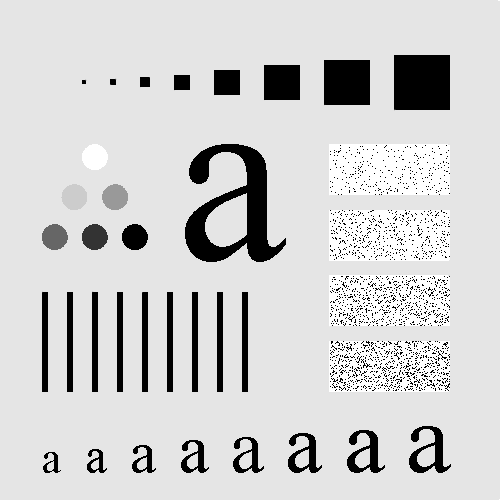

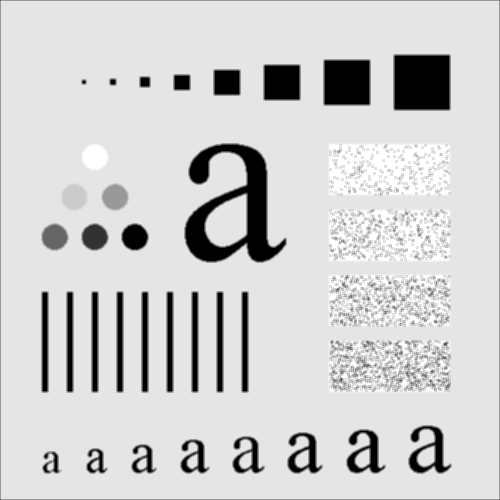

In [ ]:
# using kernel with size of 3
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0333(a)(test_pattern_blurring_orig).tif',0)
box_kernel = np.ones((3,3))*1/9

padded_img = np.pad(image, pad_width=(3//2), mode= 'constant',constant_values= 0)


output_img = np.zeros_like(image)

for i in range(1,image.shape[0]+1):
  for j in range(1,image.shape[1]+1):
    #extract the region
    region =padded_img[i-1:i+2, j-1:j+2]

    #applying convultion
    output_img[i-1,j-1] = np.sum(region * box_kernel)

output_img = np.clip(output_img, 0,255).astype(np.uint8)

cv2_imshow(image)
cv2_imshow(output_img)

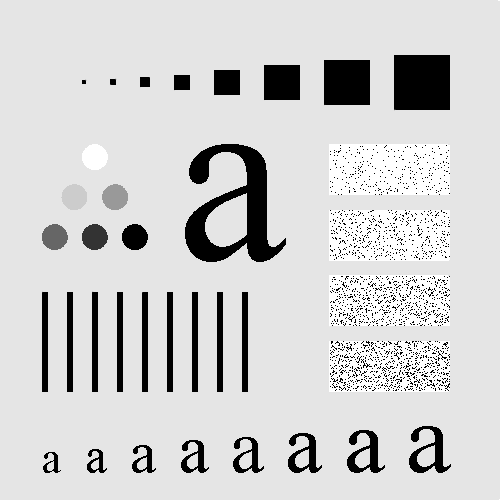

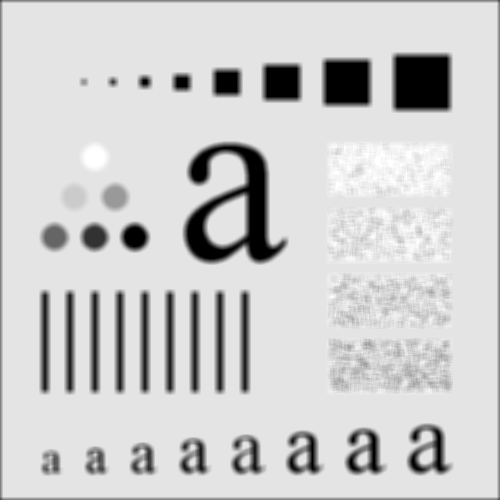

In [ ]:
#using the box kernel with size 7
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0333(a)(test_pattern_blurring_orig).tif',0)
# kernel_size = 7
box_kernel = np.ones((7,7))*1/49

padded_img = np.pad(image, pad_width=7//2, mode= 'constant',constant_values= 0)


output_img = np.zeros_like(image)

for i in range(3,image.shape[0]+3):
  for j in range(3,image.shape[1]+3):
    #extract the region
    region =padded_img[i-3:i+4, j-3:j+4]

    #applying convultion
    output_img[i-3,j-3] = np.sum(region * box_kernel)

output_img = np.clip(output_img, 0,255).astype(np.uint8)

cv2_imshow(image)
print('\n')
cv2_imshow(output_img)

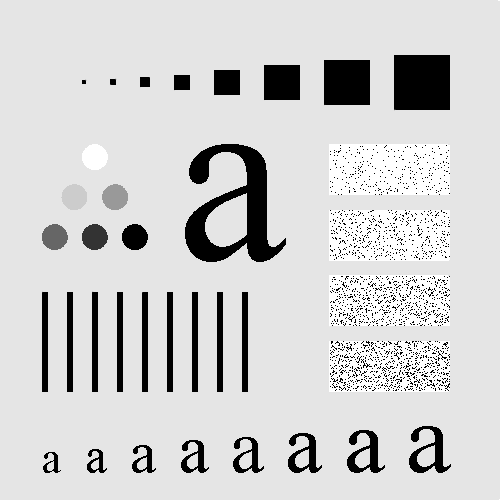

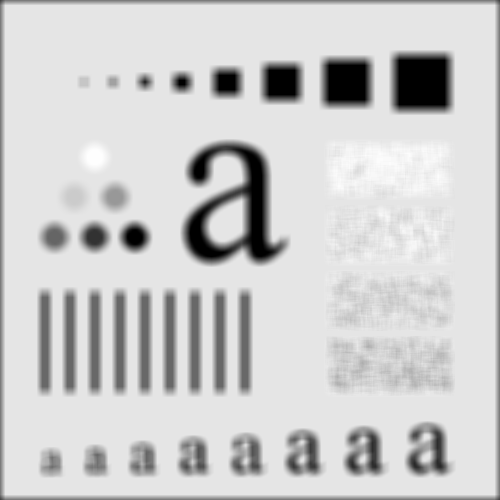

In [ ]:
#using the box kernel of size of 11
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0333(a)(test_pattern_blurring_orig).tif',0)
# kernel_size = 7
box_kernel = np.ones((11,11))*1/121

padded_img = np.pad(image, pad_width=11//2, mode= 'constant',constant_values= 0)


output_img = np.zeros_like(image)

for i in range(5,image.shape[0]+5):
  for j in range(5,image.shape[1]+5):
    #extract the region
    region =padded_img[i-5:i+6, j-5:j+6]

    #applying convultion
    output_img[i-5,j-5] = np.sum(region * box_kernel)

output_img = np.clip(output_img, 0,255).astype(np.uint8)

cv2_imshow(image)
print('\n')
cv2_imshow(output_img)

# GAUSSIAN BLURING(smoothing)

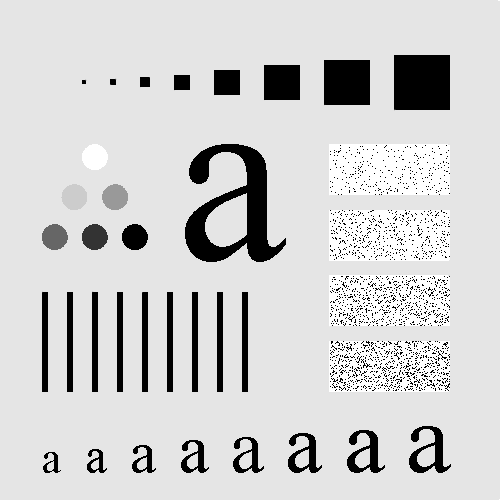

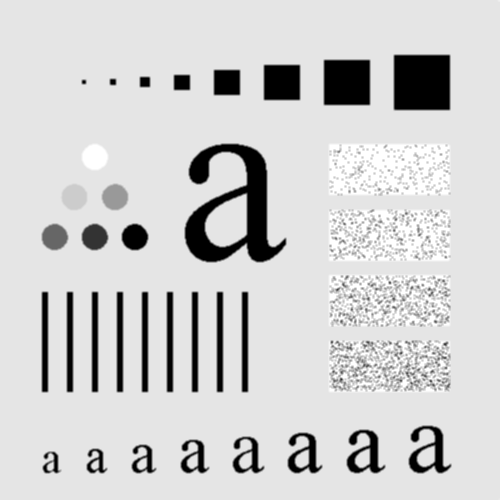

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

image = cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0333(a)(test_pattern_blurring_orig).tif',0)

# generating a gaussian kernel
def generate_gaussian_kernel(size, sigma):
  kernel = np.fromfunction(
        lambda x, y: (1/(2*np.pi*sigma**2)) * np.exp(-((x - (size-1)/2)**2 + (y - (size-1)/2)**2) / (2*sigma**2)),
        (size, size)
    )
  return kernel / np.sum(kernel)

# now defining the function for applying the gaussian
def apply_gaussian_filter(image, kernel):
  ker_cal_size=kernel.shape[0]//2
  # padded_img = np.pad(image, pad_width =ker_cal_size, mode = 'constant', constant_values = 0 )
  # by padding with the same value in the edges we have to modes reflicate and mirror bcz of it dark edges will be remove
  padded_img = np.pad(image, pad_width =ker_cal_size, mode = 'reflect')# reflect for mirror as mirror reflect


  out_image = np.zeros_like(image)
  # now creating loops for sliding the gaussian kernel
  for i in range(ker_cal_size, image.shape[0] +ker_cal_size):
    for j in range(ker_cal_size, image.shape[1] + ker_cal_size):
      # now we will extract the region on where we are sliding the filter
      region = padded_img[i-ker_cal_size:i+ker_cal_size +1, j-ker_cal_size:j+ker_cal_size+1]
      # now apply convolution
      out_image[i - ker_cal_size, j- ker_cal_size] = np.sum(region * kernel)
  return np.clip(out_image, 0,255).astype(np.uint8)

kernel_size = 3
sigma = 1.0

gaussian_kernel = generate_gaussian_kernel(kernel_size,sigma)
result_img = apply_gaussian_filter(image, gaussian_kernel)
# Display the original and filtererd image
cv2_imshow(image)
cv2_imshow(result_img)

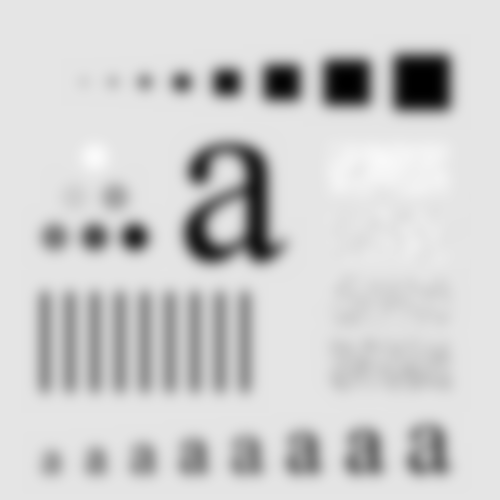

In [ ]:
# now applying gaussian of kernel size 43 and sigma value 7
gaussian_kernel_43 = generate_gaussian_kernel(43,7)
result_image_by_large_kernel = apply_gaussian_filter(image,gaussian_kernel_43)
cv2_imshow(result_image_by_large_kernel)

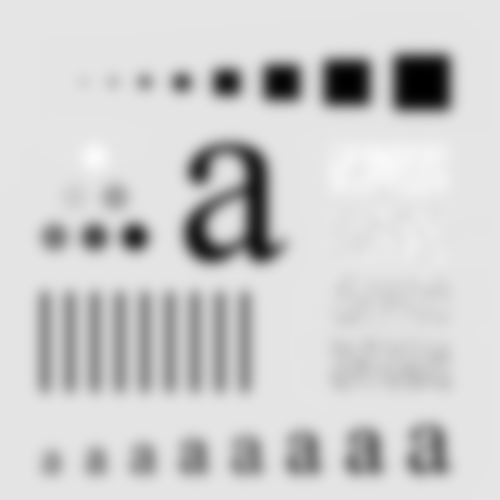

In [ ]:
# here another gaussian image with the same sigma but with large size of the kernel
gaussian_kernel_size_85 = generate_gaussian_kernel(85,7)
result_image_of_85_gaussianFilter = apply_gaussian_filter(image,gaussian_kernel_size_85)
cv2_imshow(result_image_of_85_gaussianFilter)

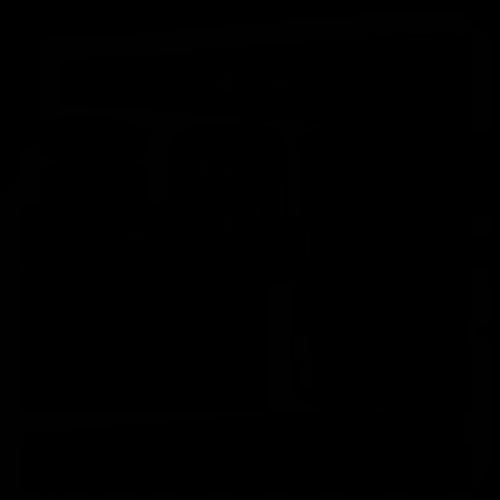

In [ ]:
# now we will differntiate these two gaussian applied images
# of size 43 and 85 but with the same sigma value to check is there
# any  difference between them or not

differenced_image = np.abs(result_image_by_large_kernel.astype(np.int32) - result_image_of_85_gaussianFilter.astype(np.int32)).astype(np.uint8)
cv2_imshow(differenced_image)

# Median Filtering(order Statistic)

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

original_img =  cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0335(a)(ckt_board_saltpep_prob_pt05).tif',cv2.IMREAD_GRAYSCALE)

# define the function for median filtering
def apply_median_filtering(image,kernel_size):
  # here we will calculate the radius of the kernel
  kernel_radius= kernel_size //2

  #now after finding the radius we will pad the original image by the pad width of kernel_radius
  padded_img = np.pad(image, pad_width = kernel_radius, mode='constant',constant_values=0)

  #now we will creat an image with pixel zeros mean an empty but of size same as original image
  out_image=np.zeros_like(image)

  #now we will create loop to slide the window and apply median
  for i in range(kernel_radius , image.shape[0] + kernel_radius):
    for j in range(kernel_radius, image.shape[1] + kernel_radius):
      # extract the region from real image
      region = padded_img[i-kernel_radius:i+kernel_radius +1, j-kernel_radius:j+kernel_radius +1]

      #now we will apply the median filtering mean convolving
      out_image[i-kernel_radius,j-kernel_radius] =int(np.median(region))

  return out_image.astype(np.uint8)

kernel_size = 7
out_image = apply_median_filtering(original_img,kernel_size)

cv2_imshow(original_img)
cv2_imshow(out_image)



# LAPLACAIN KERNEL FILTER

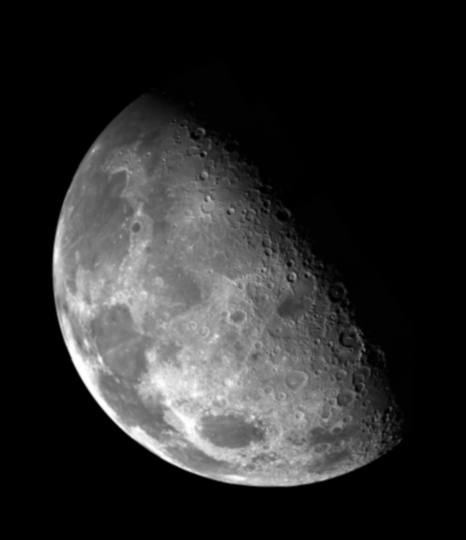

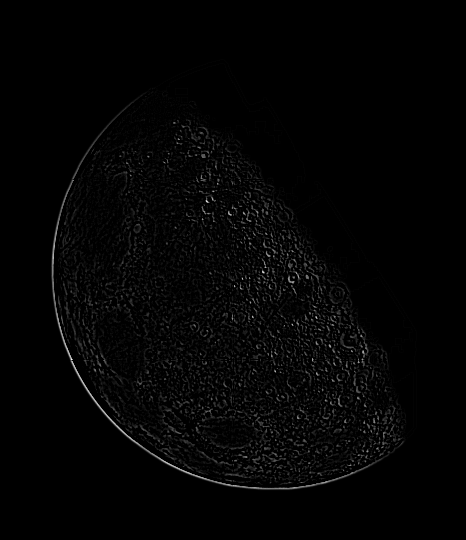

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

original_img = cv2.imread('/content/drive/MyDrive/DIP3E_Original_Images_CH03/Fig0338(a)(blurry_moon).tif',cv2.IMREAD_GRAYSCALE)


# laplacian_kernel=np.array([[0,1,0],
#                            [1,-4,1],
#                            [0,1,0]])
laplacian_kernel=np.array([[1, 1,1],
                           [1,-8,1],
                           [1, 1,1]])
def apply_laplacian_filtering(image,kernel):
  kernel_radius= kernel.shape[0] //2

  padded_img = np.pad(image, pad_width = kernel_radius, mode='constant',constant_values=0)

  out_image=np.zeros_like(image)

  for i in range(kernel_radius , image.shape[0] - kernel_radius):
    for j in range(kernel_radius, image.shape[1] - kernel_radius):
      region = padded_img[i-kernel_radius:i+kernel_radius +1, j-kernel_radius:j+kernel_radius +1]

      out_image[i,j] =0 if np.sum(region * laplacian_kernel) <0 else np.sum(region * laplacian_kernel)

  return out_image

# calling the function to apply laplacian
result_img_lapalcian = apply_laplacian_filtering(original_img,laplacian_kernel)

cv2_imshow(original_img)
cv2_imshow(result_img_lapalcian)

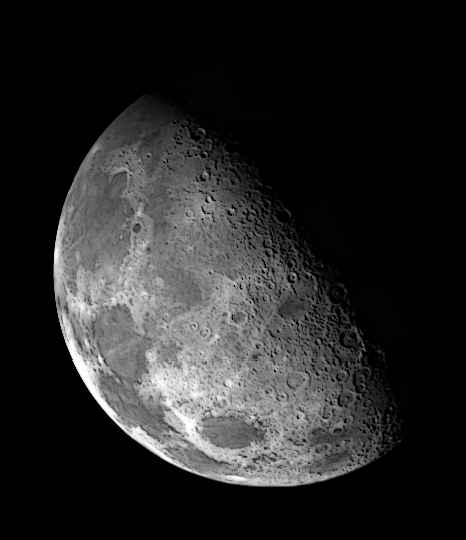

In [ ]:
sharpened_img = original_img +(-1* result_img_lapalcian)
cv2_imshow(sharpened_img)